
0: 736x1280 4 persons, 37 cars, 1 truck, 2766.0ms
Speed: 34.1ms preprocess, 2766.0ms inference, 7.0ms postprocess per image at shape (1, 3, 736, 1280)


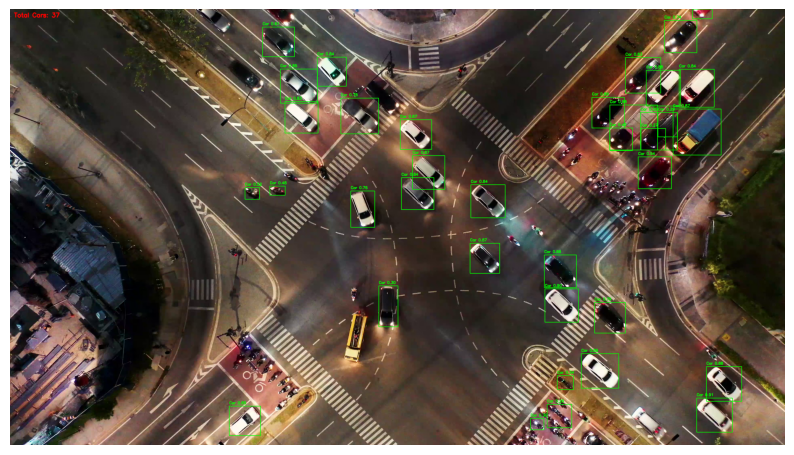


0: 736x1280 3 persons, 38 cars, 2557.4ms
Speed: 34.6ms preprocess, 2557.4ms inference, 5.9ms postprocess per image at shape (1, 3, 736, 1280)


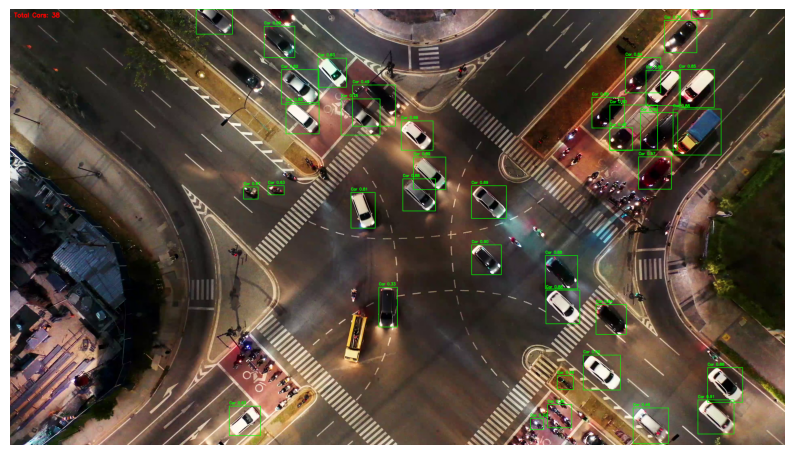


0: 736x1280 4 persons, 38 cars, 1 cell phone, 2706.1ms
Speed: 38.8ms preprocess, 2706.1ms inference, 3.5ms postprocess per image at shape (1, 3, 736, 1280)


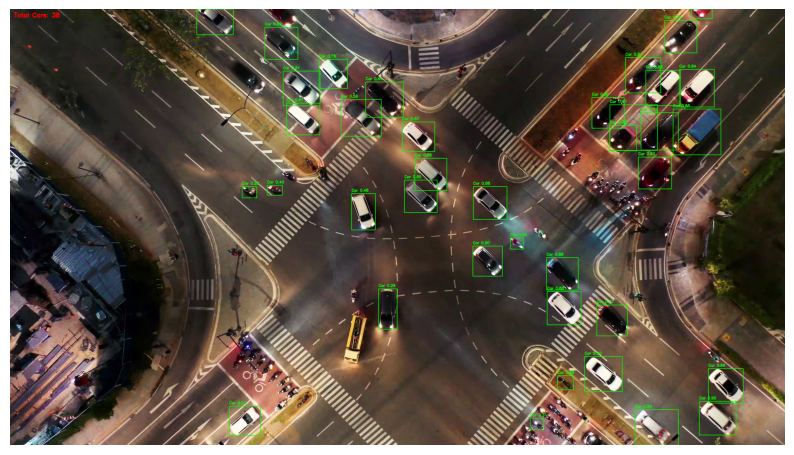


0: 736x1280 3 persons, 37 cars, 1 boat, 2291.4ms
Speed: 28.3ms preprocess, 2291.4ms inference, 5.2ms postprocess per image at shape (1, 3, 736, 1280)


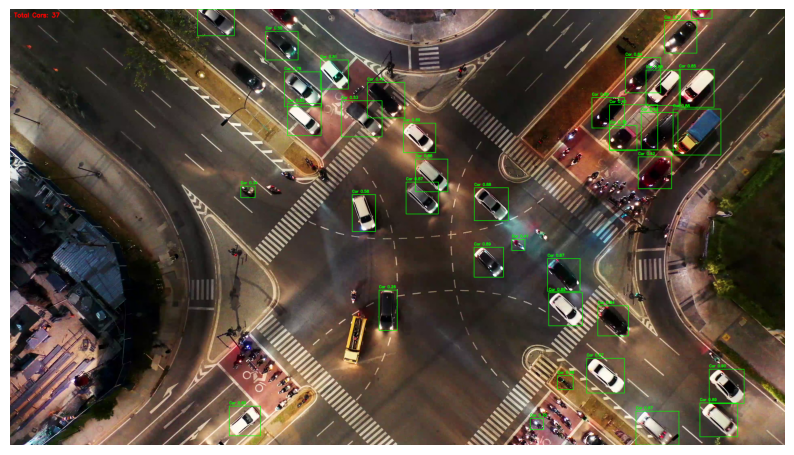


0: 736x1280 4 persons, 39 cars, 1 truck, 2516.4ms
Speed: 41.5ms preprocess, 2516.4ms inference, 3.1ms postprocess per image at shape (1, 3, 736, 1280)


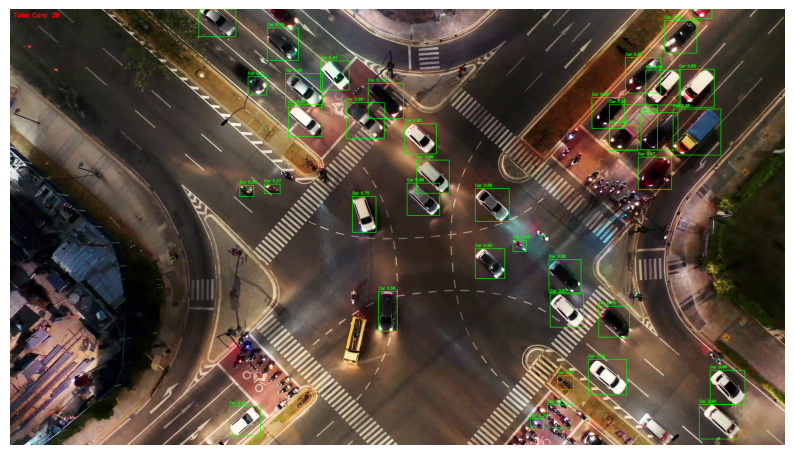


0: 736x1280 5 persons, 38 cars, 1 truck, 2569.3ms
Speed: 28.7ms preprocess, 2569.3ms inference, 5.4ms postprocess per image at shape (1, 3, 736, 1280)


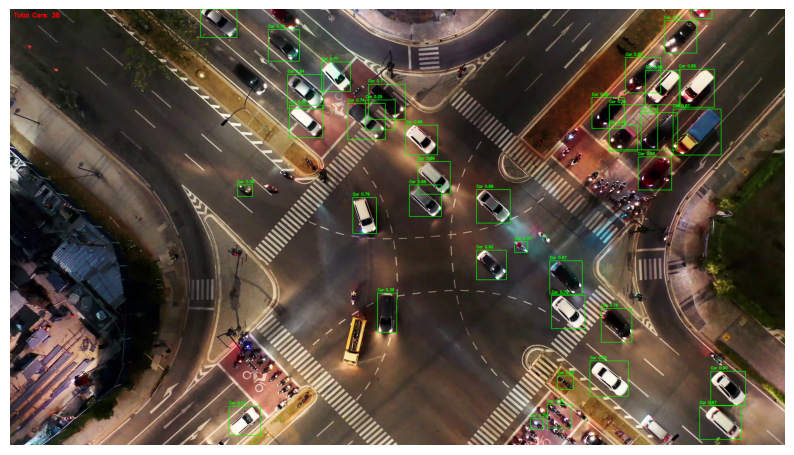


0: 736x1280 5 persons, 39 cars, 1 truck, 1 cell phone, 2607.6ms
Speed: 28.1ms preprocess, 2607.6ms inference, 5.3ms postprocess per image at shape (1, 3, 736, 1280)


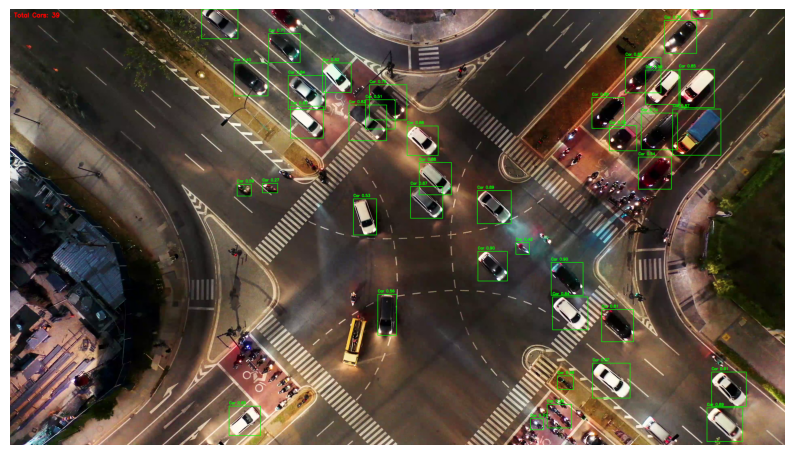


0: 736x1280 7 persons, 39 cars, 2 trucks, 2512.5ms
Speed: 36.7ms preprocess, 2512.5ms inference, 6.2ms postprocess per image at shape (1, 3, 736, 1280)


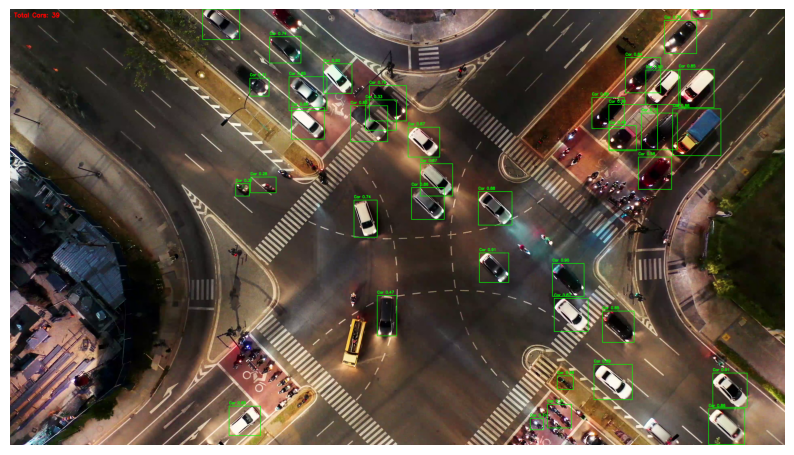


0: 736x1280 4 persons, 41 cars, 1 truck, 2723.5ms
Speed: 90.4ms preprocess, 2723.5ms inference, 6.8ms postprocess per image at shape (1, 3, 736, 1280)


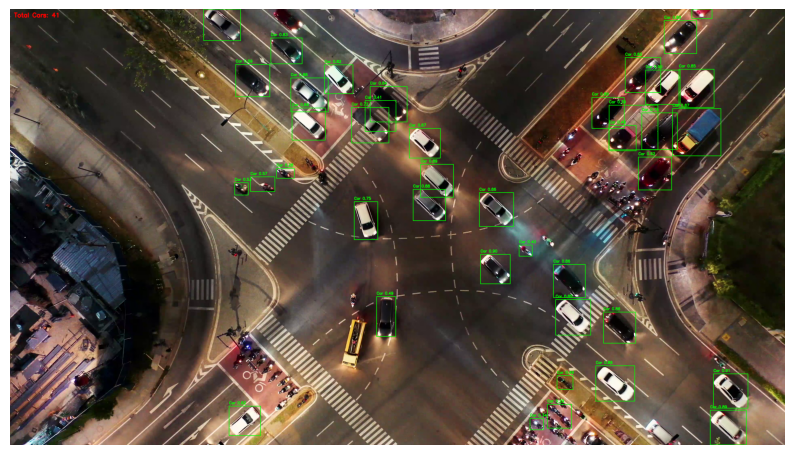


0: 736x1280 4 persons, 41 cars, 2466.4ms
Speed: 31.7ms preprocess, 2466.4ms inference, 4.7ms postprocess per image at shape (1, 3, 736, 1280)


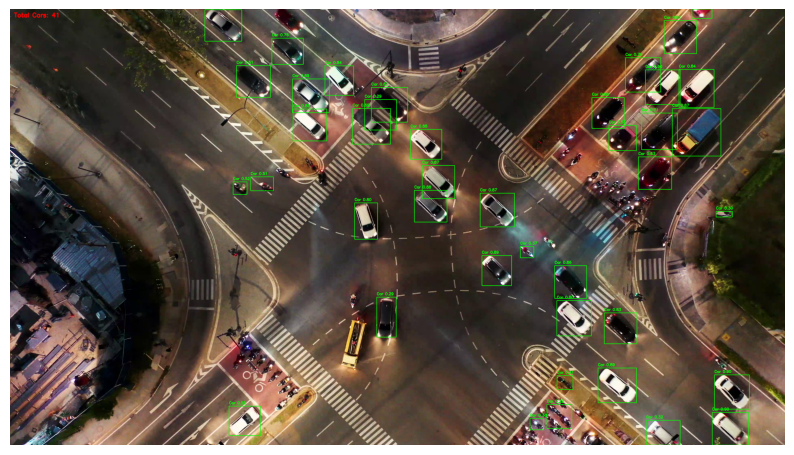


0: 736x1280 4 persons, 39 cars, 1 truck, 2566.7ms
Speed: 34.3ms preprocess, 2566.7ms inference, 6.1ms postprocess per image at shape (1, 3, 736, 1280)


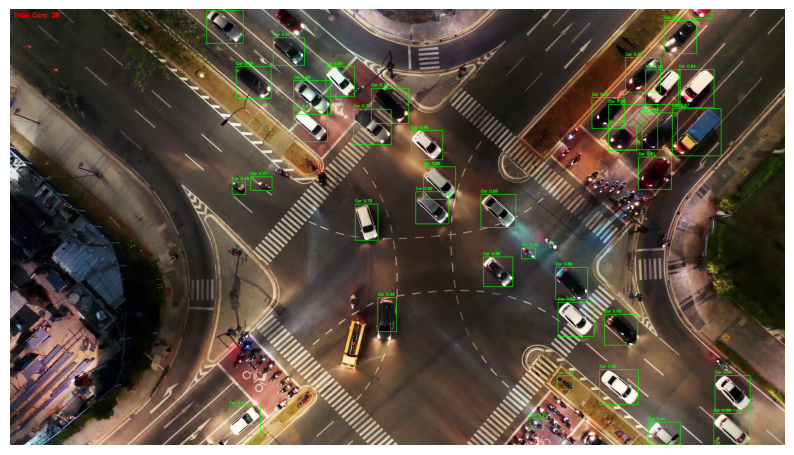

In [23]:


import cv2
import matplotlib.pyplot as plt
from ultralytics import YOLO

# Load a stronger YOLO model
model = YOLO("yolov8m.pt")   # Better than yolov8n

# Open video
cap = cv2.VideoCapture(r"C:\Users\shravani\Downloads\3052883-uhd_3840_2160_30fps.mp4")# Replace with your video file

frame_count = 0

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    frame_count += 1

    # Run detection with better parameters
    results = model(frame, 
                    conf=0.25,       # Lower confidence threshold
                    iou=0.5,        # NMS threshold
                    imgsz=1280)     # Higher resolution

    car_count = 0

    for r in results:
        boxes = r.boxes
        for box in boxes:
            cls_id = int(box.cls[0])

            # COCO class ID for car = 2
            if cls_id == 2:
                car_count += 1

                x1, y1, x2, y2 = map(int, box.xyxy[0])
                confidence = float(box.conf[0])

                # Draw bounding box
                cv2.rectangle(frame, (x1, y1), (x2, y2), (0,255,0), 2)

                # Label
                label = f"Car {confidence:.2f}"
                cv2.putText(frame, label, (x1, y1-10),
                            cv2.FONT_HERSHEY_SIMPLEX,
                            0.6, (0,255,0), 2)

    # Display total cars on frame
    cv2.putText(frame, f"Total Cars: {car_count}",
                (20, 40),
                cv2.FONT_HERSHEY_SIMPLEX,
                1, (0, 0, 255), 3)

    # Convert BGR to RGB for display
    rgb_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(10,6))
    plt.imshow(rgb_frame)
    plt.axis("off")
    plt.show()

    if frame_count > 10:   # Remove this limit for full video
        break

cap.release()
